# What could we do with more refined method, still with open data

Example using precomputed metrics on Amsterdam from https://figshare.com/articles/dataset/Global_Urban_Network_Dataset/22124219/11

In [ ]:
import osmnx as ox
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns

Below is the methodology to create the graph. For the sake of time, the graph is saved and we only need to load it in the Jupyter Notebook.

In [ ]:
# edges = gpd.read_file("../data/raw/Amsterdam_edges_100m.geojson")
# nodes = gpd.read_file("../data/raw/Amsterdam_nodes_100m.geojson")
# G = nx.MultiGraph()
# G.graph["crs"] = "epsg:4326"
# node_keys = nodes.keys()
# nodes_values = nodes.values
# for i in range(len(nodes_values)):
#     node = nodes_values[i]
#     G.add_node(node[1], **{node_keys[j]:node[j] for j in range(2, len(node_keys))})
# edge_keys = edges.keys()
# edges_values = edges.values
# for i in range(len(edges_values)):
#     edge = edges_values[i]
#     G.add_edge(edge[1], edge[2], 0, **{edge_keys[j]:edge[j] for j in range(3, len(edge_keys))})
# TIME = [5, 15] # in minutes, could add 30 but a bit long to run
# SPEED = [2, 5] # in km/h
# THRESH = 1 # num of amenities necessary
# dist = {}
# for t in TIME:
#     for s in SPEED:
#         dist[f"time_{t}_speed_{s}"] = round(1000*s*t/60) # in meters
# access_node = {}
# for d in dist:
#     access_node[d] = {}
#     for n in G.nodes:
#         eg = nx.ego_graph(G, n, radius=dist[d], distance="length")
#         if len(eg) > 1:
#             gdfn, gdfe = ox.graph_to_gdfs(eg)
#             health = False
#             food = False
#             entertainment = False
#             for key in ["Healthcare", "Food", "Entertainment"]:
#                 gdfe[key] = gdfe[key].apply(lambda x: float(x))
#             if np.sum(gdfe["Healthcare"].values) >= THRESH:
#                 health = True
#             if np.sum(gdfe["Food"].values) >= THRESH:
#                 food = True
#             if np.sum(gdfe["Entertainment"].values) >= THRESH:
#                 entertainment = True
#             access_node[d][n] = food & health & entertainment
#         else:
#             access_node[d][n] = False
# access_edge = {}
# for d in dist:
#     access_edge[d] = {}
#     for e in G.edges:
#         access_edge[d][e] = access_node[d][e[0]] or access_node[d][e[1]]
# for key in access_node:
#     nx.set_node_attributes(G, access_node[key], key)
#     nx.set_edge_attributes(G, access_edge[key], key)
# ox.save_graphml(G, "../data/processed/graphs/Amsterdam_urbanity.graphml")

In [3]:
G = ox.load_graphml("../data/processed/graphs/Amsterdam_urbanity.graphml")

Since we focus on older people, we will check on the "Elderly" values from the population dataset.

In [5]:
nodes, edges = ox.graph_to_gdfs(G)
for key in nodes.keys():
    if key == "geometry":
        pass
    else:
        nodes[key] = nodes[key].apply(lambda x: float(x))
for key in edges.keys():
    if key == "geometry":
        pass
    else:
        edges[key] = edges[key].apply(lambda x: float(x))

Results on node are for 100 meters around, which would count for nodes nearby multiple times the same object. To avoid that, we will use edges.

In [6]:
pop_sum = np.sum(edges["PopSum"].values)
eld_sum = np.sum(edges["Elderly"].values)
print(f"Total population estimated is {pop_sum}")
print(
    f"Total elderly population estimated is {eld_sum}, or {round(100 * eld_sum/pop_sum, 1)}%"
)
edges["elder_share"] = edges.apply(
    lambda x: x["Elderly"] / x["PopSum"] if x["PopSum"] > 0 else 0, axis=1
)

Total population estimated is 551277.0
Total elderly population estimated is 79522.0, or 14.4%


<Axes: xlabel='Elderly', ylabel='Count'>

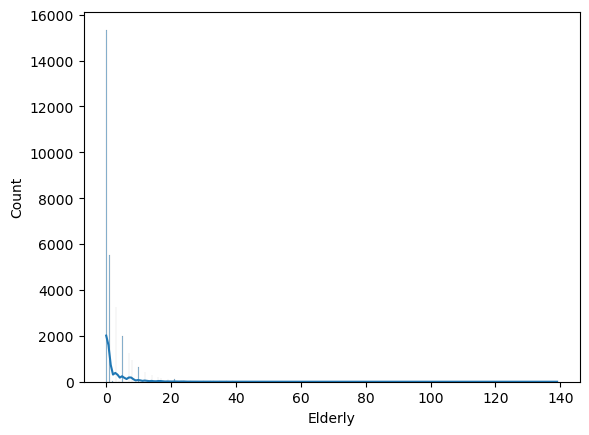

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(16, 16))
sns.histplot(edges, ax=axs[0], x="Elderly", kde=True)
sns.histplot(edges, ax=axs[1], x="elder_share", kde=True)

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

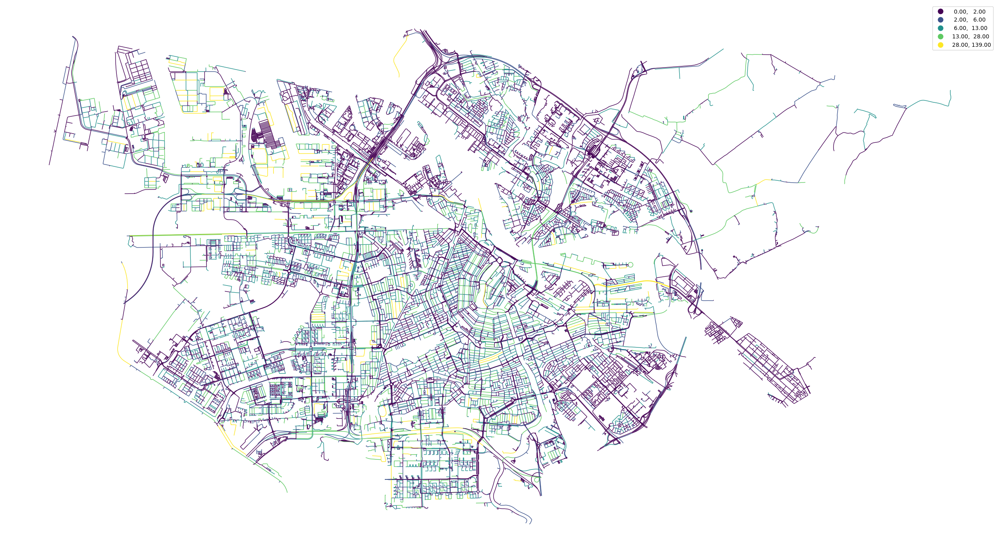

In [9]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, column="Elderly", scheme="Natural_Breaks", legend=True, linewidth=1)
ax.axis("off")

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

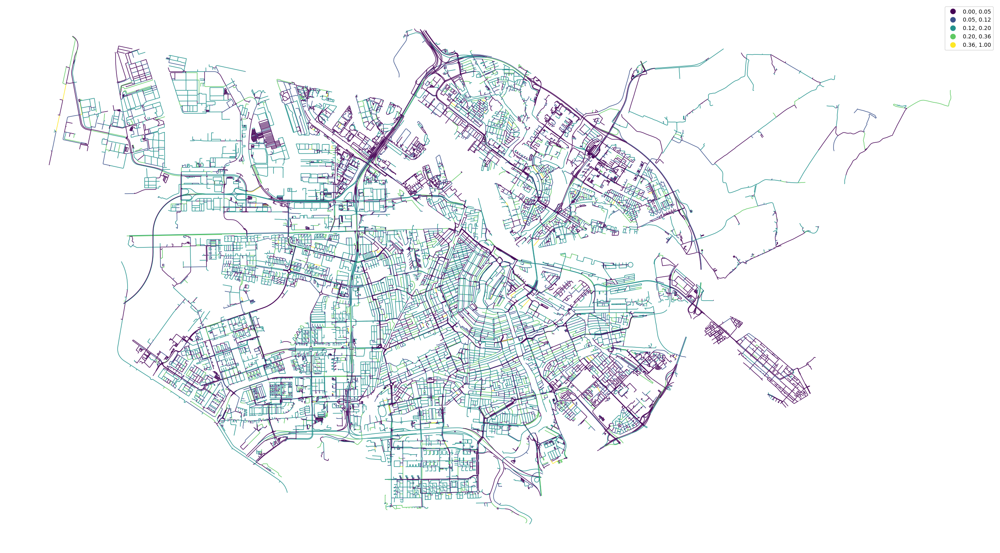

In [10]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(
    ax=ax, column="elder_share", scheme="Natural_Breaks", legend=True, linewidth=1
)
ax.axis("off")

In [ ]:
def quadrant(x):
    name = ""
    if x["Elderly"] >= 13:
        name += "he_"
    else:
        name += "le_"
    if x["elder_share"] >= 0.20:
        name += "hs"
    else:
        name += "ls"
    return name

In [ ]:
edges["quad_eld"] = edges.apply(lambda x: quadrant(x), axis=1)

In [ ]:
cmap = mpl.colors.ListedColormap(["green", "lightgreen", "blue", "lightblue"])

In [ ]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, column="quad_eld", cmap=cmap, legend=True, linewidth=1)
ax.axis("off")

## Intersection density

(4.696861726845877, 5.099740073154123, 52.302976782863, 52.446013117137)

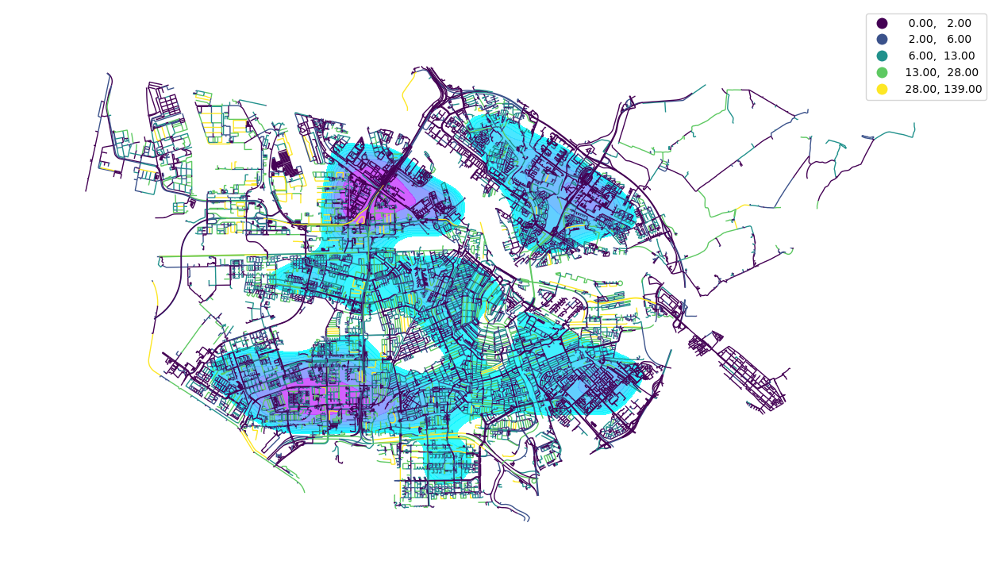

In [11]:
fig, ax = plt.subplots(figsize=(16, 16))
edges.plot(
    ax=ax, column="Elderly", legend=True, scheme="Natural_Breaks", linewidth=1, zorder=1
)
sns.kdeplot(
    nodes,
    x="x",
    y="y",
    fill=True,
    cmap="cool",
    thresh=0.5,
    alpha=0.8,
    ax=ax,
    zorder=0,
)
ax.axis("off")

## Proximity to different kind of amenities

In [17]:
nodes, edges = ox.graph_to_gdfs(G)
for key in nodes.keys():
    if key == "geometry":
        pass
    else:
        nodes[key] = nodes[key].apply(lambda x: float(x))
for key in edges.keys():
    if key == "geometry":
        pass
    else:
        edges[key] = edges[key].apply(lambda x: float(x))

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

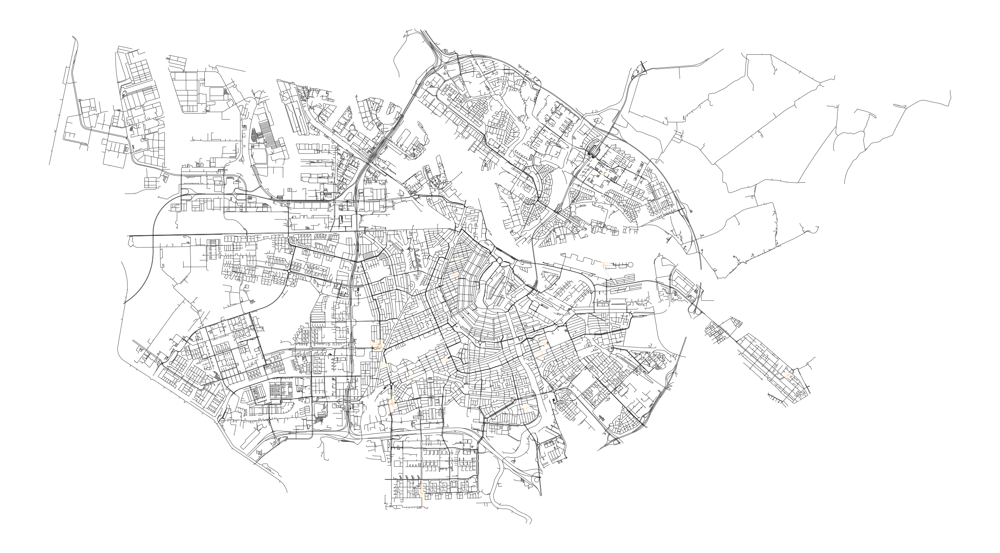

In [18]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="time_5_speed_2", cmap="copper")
ax.axis("off")

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

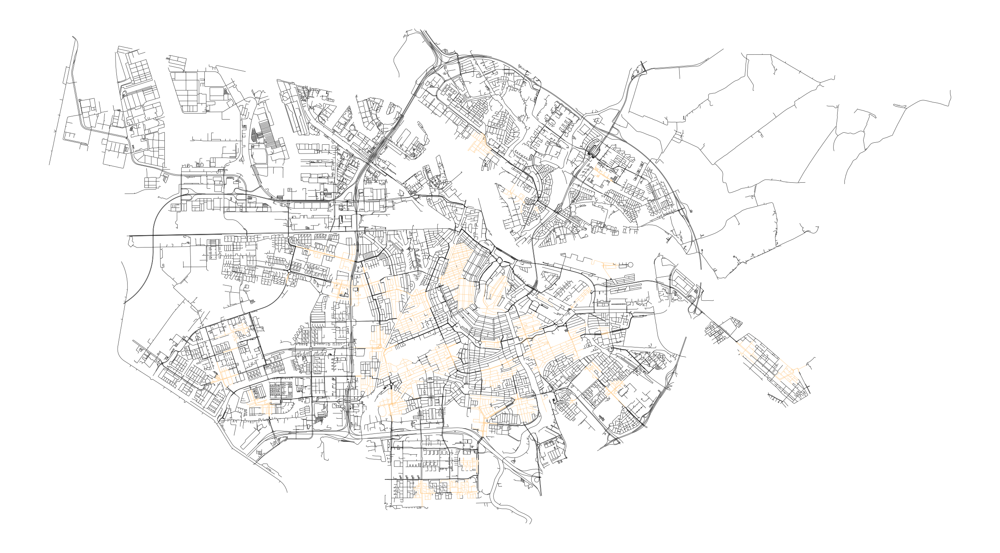

In [19]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="time_5_speed_5", cmap="copper")
ax.axis("off")

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

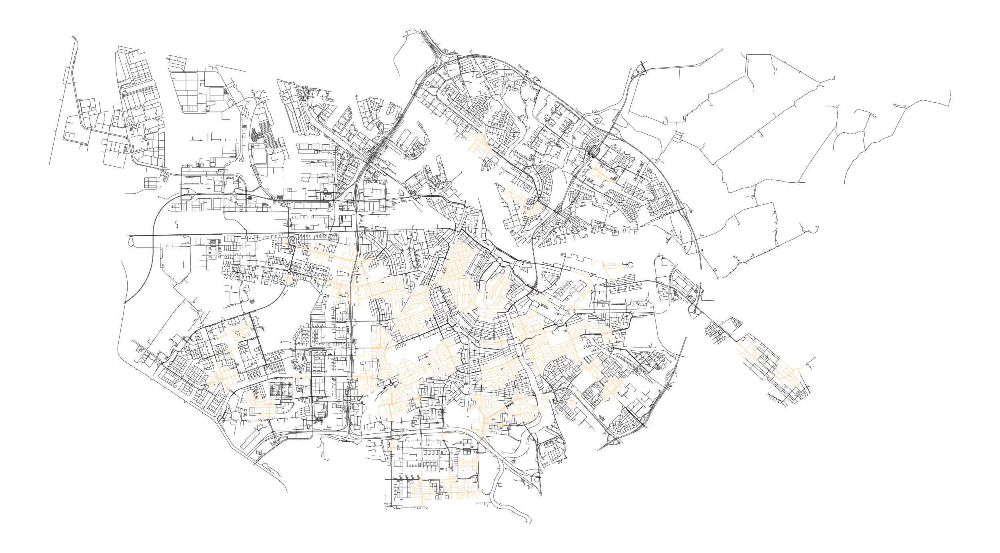

In [20]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="time_15_speed_2", cmap="copper")
ax.axis("off")

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

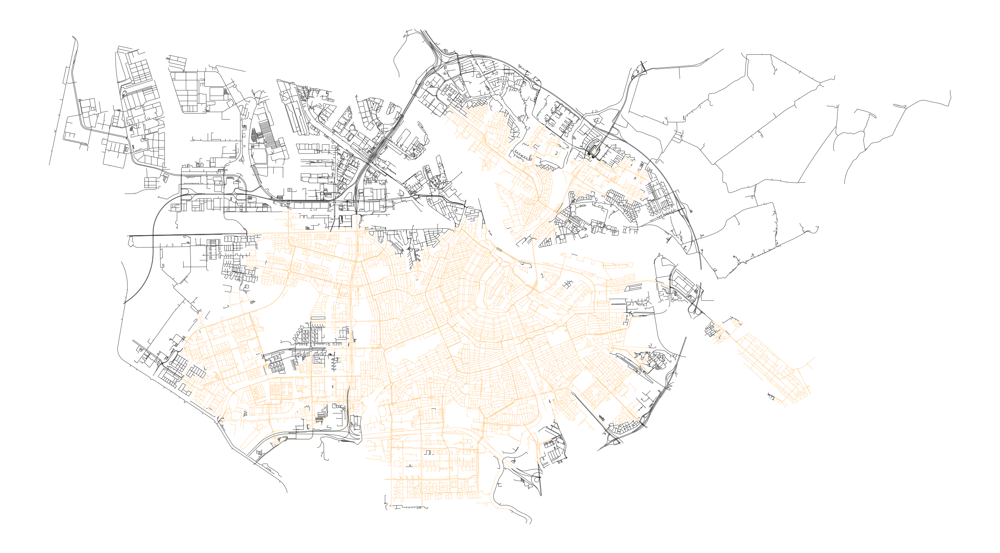

In [21]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="time_15_speed_5", cmap="copper")
ax.axis("off")

In [ ]:
# edges["Young_Adult"] = edges["PopSum"] - edges["Elderly"] - edges["Children"]
# ya_sum = np.sum(edges["Young_Adult"].values)
# part_access = np.sum(edges[edges["time_5_speed_2"] == True]["Elderly"].values)
# print(
#     f"{part_access} out of {eld_sum} or {round(100 * part_access/eld_sum, 1)}% of Eldery (2 km/h speed) have access to necessary amenities within 5 minutes range."
# )
# part_access = np.sum(
#     edges[edges["time_5_speed_5"] == True]["Young_Adult"].values
# ) - np.sum(edges[edges["time_5_speed_5"] == True]["Elderly"].values)
# print(
#     f"{part_access} out of {ya_sum} or {round(100 * part_access/ya_sum, 1)}% of Young Adult (5 km/h speed) have access to necessary amenities within 5 minutes range."
# )
# part_access = np.sum(edges[edges["time_15_speed_2"] == True]["Elderly"].values)
# print(
#     f"{part_access} out of {eld_sum} or {round(100 * part_access/eld_sum, 1)}% of Elderly (2 km/h speed) have access to necessary amenities within 15 minutes range."
# )
# part_access = np.sum(edges[edges["time_15_speed_5"] == True]["Young_Adult"].values)
# print(
#     f"{part_access} out of {ya_sum} or {round(100 * part_access/ya_sum, 1)}% of Young Adult (5 km/h speed) have access to necessary amenities within 15 minutes range."
# )

401.0 out of 79522.0 or 0.5% of Eldery (2 km/h speed) have access to necessary amenities within 5 minutes range.
44961.0 out of 445305.0 or 10.1% of Young Adult (5 km/h speed) have access to necessary amenities within 5 minutes range.
14423.0 out of 79522.0 or 18.1% of Elderly (2 km/h speed) have access to necessary amenities within 15 minutes range.
266961.0 out of 445305.0 or 60.0% of Young Adult (5 km/h speed) have access to necessary amenities within 15 minutes range.


In [23]:
def proximity(x, speed):
    if x[f"time_5_speed_{speed}"]:
        return "5"
    if x[f"time_15_speed_{speed}"]:
        return "15"
    return "Longer"

In [24]:
edges["speed_2"] = edges.apply(lambda x: proximity(x, 2), axis=1)
edges["speed_5"] = edges.apply(lambda x: proximity(x, 5), axis=1)

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

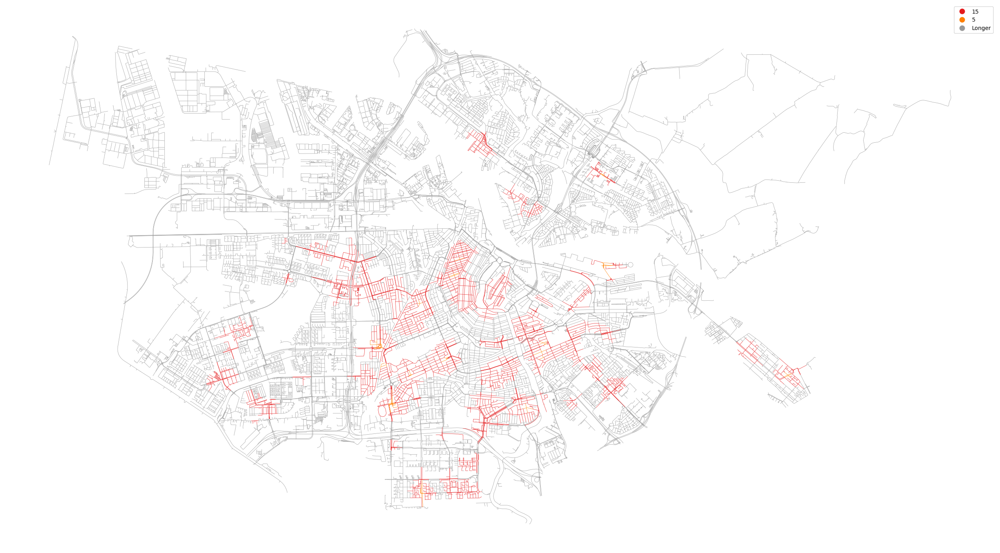

In [25]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="speed_2", cmap="Set1", legend=True)
ax.axis("off")

(4.711687605, 5.085091295000001, 52.311829435, 52.437160465)

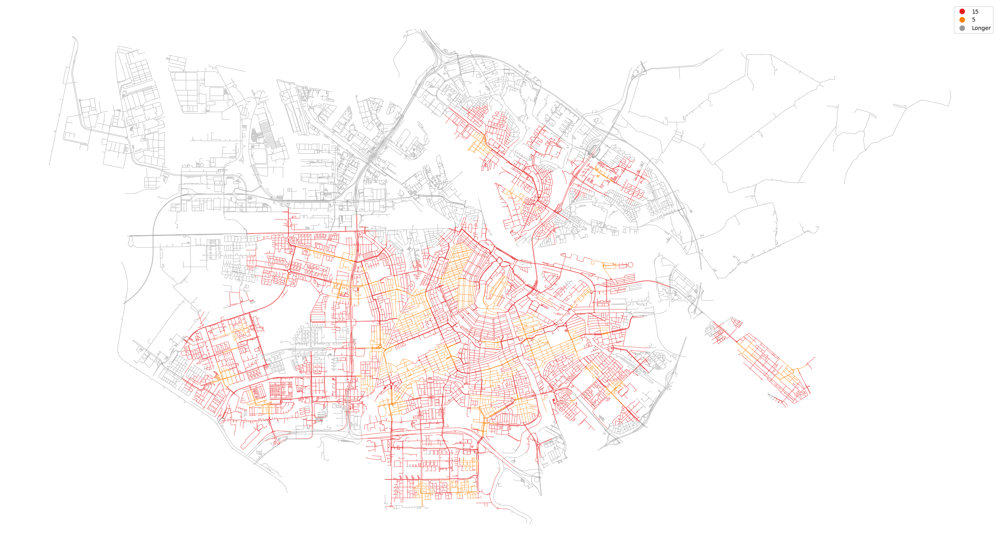

In [26]:
fig, ax = plt.subplots(figsize=(32, 20))
edges.plot(ax=ax, linewidth=0.5, column="speed_5", cmap="Set1", legend=True)
ax.axis("off")

## Proximity to natural and interesting streets

People walk not only for necessary activites like shopping, or for social activities like going to a cafe, but also for the sake of walking (see Gehl). For this, we can use Street View Imagery to classify the greenery and the visual complexity visible within each street, a good indicator of how desirable a street is.